<a href="https://colab.research.google.com/github/NoelMoralesC/Empresas_Agropecuarias_DENUE_INEGI_2022/blob/main/DENUE_INEGI_NOEL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [27]:
!pip install keplergl

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [56]:
#Importamos las librerías a ocupar
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import keplergl


## Leyendo datos del Directorio Estadístico Nacional de Unidades Económicas (DENUE 05-2022) perteneciente al INEGI ##

#### Buscamoos unidades economicas de nuestro interes seleccionando el siguiente cuyo titulo es:

*   Agricultura, cría y explotación de animales, aprovechamiento forestal, pesca y caza



In [29]:
df = pd.read_csv('https://raw.githubusercontent.com/NoelMoralesC/Empresas_Agropecuarias_DENUE_INEGI_2022/main/denue_00_11_csv/conjunto_de_datos/denue_inegi_11_.csv', encoding = 'cp1252')

In [30]:
df.head()

,id,clee,nom_estab,raz_social,codigo_act,nombre_act,per_ocu,tipo_vial,nom_vial,tipo_v_e_1,...,localidad,ageb,manzana,telefono,correoelec,www,tipoUniEco,latitud,longitud,fecha_alta
0,6862345,01001115119000031001000000U2,AGROPECUARIA CHARCOS DE QUEZADA,AGROPECUARIA CHARCOS DE QUEZADA SOCIEDAD DE PR...,115119,Otros servicios relacionados con la agricultura,6 a 10 personas,AVENIDA,UNIVERSIDAD,CALLE,...,Aguascalientes,0233,9,4.492854e+09,MICHAEL.GALINDO@UGASA.COM.MX,NaN,Fijo,21.906992,-102.309807,2019-04
1,6905212,01001115119000041000000000U1,AGROPECUARIO LOS ALAMITOS,NaN,115119,Otros servicios relacionados con la agricultura,0 a 5 personas,CALLE,J. ENCARNACION PAYEN,CALLE,...,Aguascalientes,0322,18,4.499960e+09,NaN,NaN,Fijo,21.889926,-102.314009,2019-11
2,6166248,01007112512000012001000000U8,CENTRO ACUÍCOLA PABELLON DE HIDALGO,SAGARPA,112512,"Piscicultura y otra acuicultura, excepto camar...",0 a 5 personas,CALLE,NINGUNO,CALLE,...,SEMARNAT [Centro Acuícola],0078,800,NaN,NaN,WWW.GOB.MX/CONAPESCA,Fijo,22.167778,-102.345556,2010-07
3,6166233,01010112512000011000000000U9,G. ACUÍCOLA SANTA ROSA,NaN,112512,"Piscicultura y otra acuicultura, excepto camar...",6 a 10 personas,CARRETERA,SECTOR DE PRODUCCION N0 1 TERREMOTO EL LLANO A...,CARRETERA,...,Santa Rosa [Granja Acuícola],0069,800,NaN,NaN,NaN,Fijo,21.956298,-101.997312,2014-12
4,6166234,01003112512000031001000000U7,GRANJA ACUICOLA ARROYO DE LOS CABALLOS,NaN,112512,"Piscicultura y otra acuicultura, excepto camar...",0 a 5 personas,PROLONGACION,CUAUHTUMOC,CARRETERA,...,Arroyo Ojocalientillo,0100,2,4.492742e+09,MARTINSAU2720@HOTMAIL.COM,NaN,Fijo,21.837255,-102.710931,2014-12


In [31]:
# Resumen de las características de las variables
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21998 entries, 0 to 21997
Data columns (total 42 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   id          21998 non-null  int64  
 1   clee        21998 non-null  object 
 2   nom_estab   21998 non-null  object 
 3   raz_social  5949 non-null   object 
 4   codigo_act  21998 non-null  int64  
 5   nombre_act  21998 non-null  object 
 6   per_ocu     21998 non-null  object 
 7   tipo_vial   21973 non-null  object 
 8   nom_vial    21926 non-null  object 
 9   tipo_v_e_1  21954 non-null  object 
 10  nom_v_e_1   21723 non-null  object 
 11  tipo_v_e_2  21954 non-null  object 
 12  nom_v_e_2   21708 non-null  object 
 13  tipo_v_e_3  21954 non-null  object 
 14  nom_v_e_3   21582 non-null  object 
 15  numero_ext  16657 non-null  float64
 16  letra_ext   11707 non-null  object 
 17  edificio    438 non-null    object 
 18  edificio_e  428 non-null    object 
 19  numero_int  11829 non-nul

### Análisis, limpieza y selección de datos

Localizacion de datos nulos en la base de datos. Se observa que la mayoria de los datos nulos corresponden a las especificaciones de direccion (calle, edificio, numero exterior o interior) asi como datos de contacto

In [32]:

df.isnull().sum()

id                0
clee              0
nom_estab         0
raz_social    16049
codigo_act        0
nombre_act        0
per_ocu           0
tipo_vial        25
nom_vial         72
tipo_v_e_1       44
nom_v_e_1       275
tipo_v_e_2       44
nom_v_e_2       290
tipo_v_e_3       44
nom_v_e_3       416
numero_ext     5341
letra_ext     10291
edificio      21560
edificio_e    21570
numero_int    10169
letra_int     21186
tipo_asent       11
nomb_asent        1
tipoCenCom    21872
nom_CenCom    21875
num_local     21908
cod_postal      354
cve_ent           0
entidad           0
cve_mun           0
municipio         0
cve_loc           0
localidad         0
ageb              0
manzana           0
telefono      14742
correoelec    19779
www           21873
tipoUniEco        0
latitud           0
longitud          0
fecha_alta        0
dtype: int64

Observamos la estructura de la primera fila de la base de datos con el fin de encontrar las variables que nos permitar hacen inferencias

In [33]:
pd.DataFrame(df.loc[0])

,0
id,6862345
clee,01001115119000031001000000U2
nom_estab,AGROPECUARIA CHARCOS DE QUEZADA
raz_social,AGROPECUARIA CHARCOS DE QUEZADA SOCIEDAD DE PR...
codigo_act,115119
nombre_act,Otros servicios relacionados con la agricultura
per_ocu,6 a 10 personas
tipo_vial,AVENIDA
nom_vial,UNIVERSIDAD
tipo_v_e_1,CALLE


Seleccionando solo variables relevantes ya que la mayoria son especificaciones en la direccion y contacto de la unidad economica

In [34]:
pd.DataFrame(df.loc[0,['nom_estab', 'raz_social', 'nombre_act', 'per_ocu', 'entidad', 'municipio', 'localidad', 'latitud', 'longitud']])

,0
nom_estab,AGROPECUARIA CHARCOS DE QUEZADA
raz_social,AGROPECUARIA CHARCOS DE QUEZADA SOCIEDAD DE PR...
nombre_act,Otros servicios relacionados con la agricultura
per_ocu,6 a 10 personas
entidad,AGUASCALIENTES
municipio,Aguascalientes
localidad,Aguascalientes
latitud,21.906992
longitud,-102.309807


### Resultado del anális de datos ###

Encontramos que las variables de interés para análisis son los siguientes

1.   nom_estab: Es el nombre comercial o nombre exterior con el que se       identifica o anuncia la unidad económica.

2.   raz_social: Es la forma con que está legalmente constituida y registrada la persona moral, o la denominación de una sociedad legalmente constituida.

3.   nombre_act: Nombre del código de actividad conforme al SCIAN 2018.

4.   per_ocu: Las unidades económicas se clasifican por rangos de personal ocupado, que permiten identificar el tamaño de Unidades Económicas por el número de personal que emplean; es decir, según su personal ocupado total.

Y para la generación de un  mapa ocupamos los datos de:


*   latitud
*   longitud

Complementando con las siguientes variables:

*   entidad
*   municipio
*   localidad












In [35]:
df2 = df.loc[1:,('nom_estab', 'raz_social', 'nombre_act', 'per_ocu', 'entidad', 'municipio', 'localidad', 'latitud', 'longitud')]
df2

,nom_estab,raz_social,nombre_act,per_ocu,entidad,municipio,localidad,latitud,longitud
1,AGROPECUARIO LOS ALAMITOS,NaN,Otros servicios relacionados con la agricultura,0 a 5 personas,AGUASCALIENTES,Aguascalientes,Aguascalientes,21.889926,-102.314009
2,CENTRO ACUÍCOLA PABELLON DE HIDALGO,SAGARPA,"Piscicultura y otra acuicultura, excepto camar...",0 a 5 personas,AGUASCALIENTES,Rincón de Romos,SEMARNAT [Centro Acuícola],22.167778,-102.345556
3,G. ACUÍCOLA SANTA ROSA,NaN,"Piscicultura y otra acuicultura, excepto camar...",6 a 10 personas,AGUASCALIENTES,El Llano,Santa Rosa [Granja Acuícola],21.956298,-101.997312
4,GRANJA ACUICOLA ARROYO DE LOS CABALLOS,NaN,"Piscicultura y otra acuicultura, excepto camar...",0 a 5 personas,AGUASCALIENTES,Calvillo,Arroyo Ojocalientillo,21.837255,-102.710931
5,GRANJA ACUÍCOLA HIDROCALIDA,ACUICOLA HIDROCALIDA SC DE RL DE CV,"Piscicultura y otra acuicultura, excepto camar...",0 a 5 personas,AGUASCALIENTES,Aguascalientes,La Cotorra,21.832530,-102.376067
...,...,...,...,...,...,...,...,...,...
21993,SOCIEDAD DE PRODUCCION RURAL DE R. L. LA PEQUE...,SOCIEDAD DE PRODUCCION RURAL DE R. L. LA PEQUE...,"Pesca y captura de peces, crustáceos, moluscos...",11 a 30 personas,ZACATECAS,Villanueva,General Francisco Murguía,22.486466,-102.770739
21994,SOCIEDAD DE PRODUCCIÓN RURAL DE RL LA PEQUEÑA ANA,LA PEQUEÑA ANA SPR DE RL,"Pesca y captura de peces, crustáceos, moluscos...",11 a 30 personas,ZACATECAS,Villanueva,Villanueva,22.358479,-102.874682
21995,"SOCIEDAD PESQUERA CALERILLA S,C, DE R.L.",SOCIEDAD PESQUERA CALERILLA SA DE CV,"Pesca y captura de peces, crustáceos, moluscos...",0 a 5 personas,ZACATECAS,Zacatecas,Calerilla,22.685103,-102.647913
21996,TAYAHUA S.C.L.,NaN,"Pesca y captura de peces, crustáceos, moluscos...",11 a 30 personas,ZACATECAS,Villanueva,Tayahua (San José de Tayahua),22.094269,-102.870561


In [36]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21997 entries, 1 to 21997
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   nom_estab   21997 non-null  object 
 1   raz_social  5948 non-null   object 
 2   nombre_act  21997 non-null  object 
 3   per_ocu     21997 non-null  object 
 4   entidad     21997 non-null  object 
 5   municipio   21997 non-null  object 
 6   localidad   21997 non-null  object 
 7   latitud     21997 non-null  float64
 8   longitud    21997 non-null  float64
dtypes: float64(2), object(7)
memory usage: 1.5+ MB


**Cantidad de Unidades Economicas por Estado**

In [37]:
pd.DataFrame(df2['entidad'].value_counts())

,entidad
TABASCO,2894
OAXACA,2640
VERACRUZ DE IGNACIO DE LA LLAVE,2311
SINALOA,2247
GUERRERO,1314
YUCATÁN,1294
NAYARIT,1175
SONORA,1066
CAMPECHE,1001
TAMAULIPAS,865


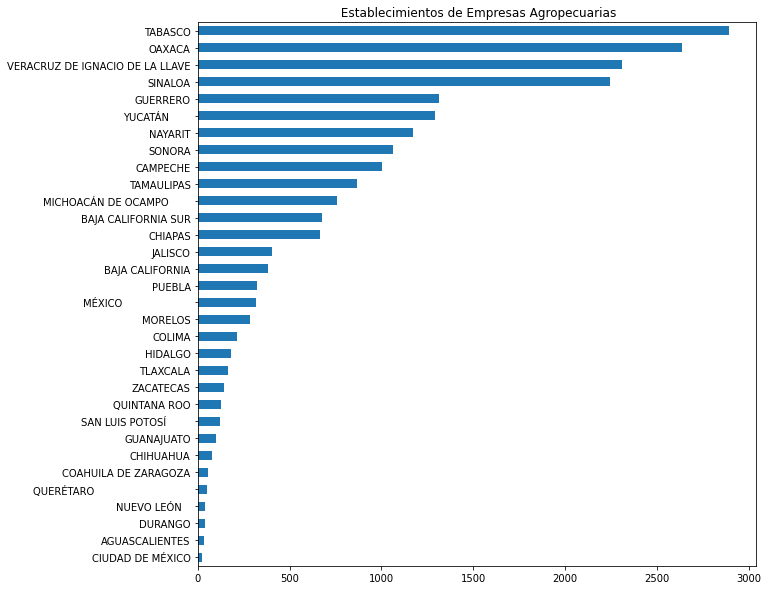

In [38]:
df2['entidad'].value_counts().sort_values().plot(kind='barh', 
                                  title=' Establecimientos de Empresas Agropecuarias', figsize=(10,10))

**Cantidad de personas empleadas por unidad economica**

In [39]:
pd.DataFrame(df2['per_ocu'].value_counts())

,per_ocu
0 a 5 personas,15355
11 a 30 personas,2823
6 a 10 personas,2070
31 a 50 personas,865
51 a 100 personas,605
101 a 250 personas,228
251 y más personas,51


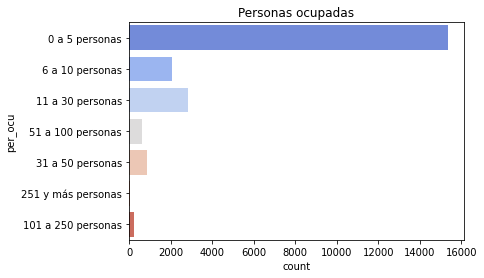

In [40]:
sns.countplot(y='per_ocu',palette='coolwarm', data=df2).set_title('Personas ocupadas')
plt.show()

**Tipo de actividad economica que desempeñan las unidades economicas**

In [41]:
pd.DataFrame(df2['nombre_act'].value_counts())

,nombre_act
"Pesca y captura de peces, crustáceos, moluscos y otras especies",13984
Pesca de camarón,3243
"Piscicultura y otra acuicultura, excepto camaronicultura",2587
Camaronicultura,908
Beneficio de productos agrícolas,640
Otros servicios relacionados con la agricultura,238
Servicios de fumigación agrícola,138
Servicios relacionados con la cría y explotación de animales,96
Pesca de túnidos,56
Pesca de sardina y anchoveta,52


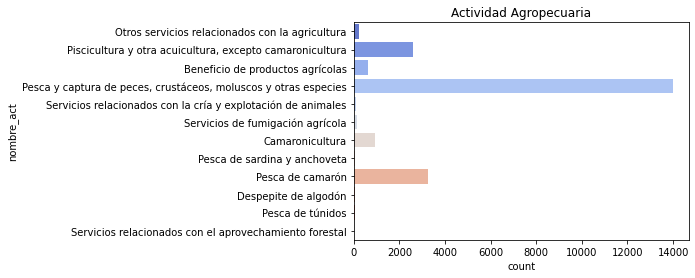

In [42]:
sns.countplot(y='nombre_act', palette='coolwarm', data=df2).set_title('Actividad Agropecuaria')
plt.show()

**Numero de establecimientos con el mismo nombre**

In [43]:
nomb_est = pd.DataFrame(df2['nom_estab'].value_counts())
nomb_est

,nom_estab
"PESCA Y CAPTURA DE OTROS PECES, CRUSTÁCEOS, MOLUSCOS Y OTRAS ESPECIES",6773
PESCA DE CAMARÓN,1392
PESCADOR SIN NOMBRE,803
"PESCA DE CRUSTÁCEOS, MOLUSCOS Y OTROS PECES SIN NOMBRE",470
"PISCICULTURA Y OTRA ACUICULTURA, EXCEPTO CAMARONICULTURA",297
...,...
VALERIOS GROUP,1
UPA LA ESCONDIDITA,1
UNIDAD TRUTICULA EL ANCON,1
UNIDAD TRUTICOLA LAS PINITAS AC,1


Nos damos cuenta que hay 9259 nombres de establecimientos muy genericos y que se repiten muchas veces asi como nombres de empresas que solo se repiten una vez

**Revisamos la descripcion completa de nom_estab**

---



Es el nombre comercial o nombre exterior con el que se identifica o anuncia la unidad económica.Generalmente es fácil reconocerlo porque está visible y escrito en rótulos, fachadas o anuncios luminosos. Ejemplo: ABARROTES LUPITA.  Cuando la unidad económica no tiene ningún apelativo comercial, entonces se registra con el nombre genérico de la actividad o la descripción de la actividad económica, ejemplo: ABARROTES o Comercio al por menor en tiendas de abarrotes, ultramarinos y misceláneas.


In [44]:
# En el nuevo dataframe (df2) cuantos datos nulos tenemos
df2.isnull().sum()

nom_estab         0
raz_social    16049
nombre_act        0
per_ocu           0
entidad           0
municipio         0
localidad         0
latitud           0
longitud          0
dtype: int64

## Empresas con Razón social

Es la forma con que está legalmente constituida y registrada la persona moral, o la denominación de una sociedad legalmente constituida. Es importante considerar que en algunas sociedades mercantiles, la razón social y el nombre comercial pueden ser los mismos, ejemplo: GILSA, S.A. de C.V. Cuando la unidad económica pertenece a una persona física, el dato no se incluye para proteger la confidencialidad de la información.

In [45]:
# Cantidad de datos nulos en la variable de razon social
df2.isnull().sum()

nom_estab         0
raz_social    16049
nombre_act        0
per_ocu           0
entidad           0
municipio         0
localidad         0
latitud           0
longitud          0
dtype: int64

In [46]:
# Tenemos que 5948 en razon social no son nulos
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21997 entries, 1 to 21997
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   nom_estab   21997 non-null  object 
 1   raz_social  5948 non-null   object 
 2   nombre_act  21997 non-null  object 
 3   per_ocu     21997 non-null  object 
 4   entidad     21997 non-null  object 
 5   municipio   21997 non-null  object 
 6   localidad   21997 non-null  object 
 7   latitud     21997 non-null  float64
 8   longitud    21997 non-null  float64
dtypes: float64(2), object(7)
memory usage: 1.5+ MB


In [47]:
#Creamos un dataset que no contenga valores nulos en la variable de razon social
df_rs = pd.DataFrame(df.loc[df.raz_social.notnull()])
df_rs

,id,clee,nom_estab,raz_social,codigo_act,nombre_act,per_ocu,tipo_vial,nom_vial,tipo_v_e_1,...,localidad,ageb,manzana,telefono,correoelec,www,tipoUniEco,latitud,longitud,fecha_alta
0,6862345,01001115119000031001000000U2,AGROPECUARIA CHARCOS DE QUEZADA,AGROPECUARIA CHARCOS DE QUEZADA SOCIEDAD DE PR...,115119,Otros servicios relacionados con la agricultura,6 a 10 personas,AVENIDA,UNIVERSIDAD,CALLE,...,Aguascalientes,0233,9,4.492854e+09,MICHAEL.GALINDO@UGASA.COM.MX,NaN,Fijo,21.906992,-102.309807,2019-04
2,6166248,01007112512000012001000000U8,CENTRO ACUÍCOLA PABELLON DE HIDALGO,SAGARPA,112512,"Piscicultura y otra acuicultura, excepto camar...",0 a 5 personas,CALLE,NINGUNO,CALLE,...,SEMARNAT [Centro Acuícola],0078,800,NaN,NaN,WWW.GOB.MX/CONAPESCA,Fijo,22.167778,-102.345556,2010-07
5,8704435,01001112512000042000000000U8,GRANJA ACUÍCOLA HIDROCALIDA,ACUICOLA HIDROCALIDA SC DE RL DE CV,112512,"Piscicultura y otra acuicultura, excepto camar...",0 a 5 personas,OTRO (ESPECIFIQUE),CARRETERA A VILLA HIDALGO AGUASCALIENTES,OTRO (ESPECIFIQUE),...,La Cotorra,1759,800,4.494648e+09,ACUICOLA.HIDROCALIDA@GMAIL.COM,WWW.ACUICOLA-HIDROCALIDA.COM,Fijo,21.832530,-102.376067,2019-11
6,8443604,01007112512000031000000000U8,GRANJA ACUÍCOLA PABELLON S DE R.L MI DE CV,GRANJA ACUICOLA PABELLON S DE RL MI DE CV,112512,"Piscicultura y otra acuicultura, excepto camar...",0 a 5 personas,CARRETERA,A SAN JOSE DE GRACIA KM 3.5,CALLE,...,SEMARNAT [Centro Acuícola],0078,800,4.494414e+09,ILEANA.MARTINDELCAMPO@HOTMAIL.COM,NaN,Fijo,22.168347,-102.344848,2019-11
9,6862091,01001115113000013001000000U3,LA PRADERA DE LA FRUTA,LA PRADERA DE LA FRUTA SC DE RL DE CV,115113,Beneficio de productos agrícolas,11 a 30 personas,CALLE,CERRO DEL CUBILETE,CALLE,...,Aguascalientes,2403,8,NaN,LUIS.LOPEZ@PRAFRUT.COM,NaN,Fijo,21.922671,-102.302101,2019-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21991,6705222,32055114119000041000000000U1,SOCIEDAD COOPERATIVA PRESA MALPASO,SOCIEDAD COOPERATIVA PRESA MALPASO SC DE RL DE CV,114119,"Pesca y captura de peces, crustáceos, moluscos...",0 a 5 personas,CALLE,CALLE DE LA CRUZ 302,CALLE,...,Malpaso,0600,11,NaN,NaN,NaN,Fijo,22.621094,-102.762800,2016-01
21992,6185962,32055114119000421000000000U5,SOCIEDAD COPERATIVA DE R.L DE C.V. TAYAHUA,SOCIEDAD COOPERATIVA DE RL DE CV,114119,"Pesca y captura de peces, crustáceos, moluscos...",0 a 5 personas,CALLE,HEROES DE NACOZARI,CALLE,...,Tayahua (San José de Tayahua),0189,114,NaN,NaN,NaN,Fijo,22.097621,-102.867069,2014-12
21993,6185994,32055114119000411001000000U6,SOCIEDAD DE PRODUCCION RURAL DE R. L. LA PEQUE...,SOCIEDAD DE PRODUCCION RURAL DE R. L. LA PEQUE...,114119,"Pesca y captura de peces, crustáceos, moluscos...",11 a 30 personas,CALLE,MOCTEZUMA,CARRETERA,...,General Francisco Murguía,0032,21,4.991001e+09,NaN,NaN,Fijo,22.486466,-102.770739,2014-12
21994,8789584,32055114119000503000000000U0,SOCIEDAD DE PRODUCCIÓN RURAL DE RL LA PEQUEÑA ANA,LA PEQUEÑA ANA SPR DE RL,114119,"Pesca y captura de peces, crustáceos, moluscos...",11 a 30 personas,OTRO (ESPECIFIQUE),ZARAGOZA,OTRO (ESPECIFIQUE),...,Villanueva,0564,8,4.991001e+09,NaN,NaN,Fijo,22.358479,-102.874682,2019-11


**Establecimientos de empresas que tiene razon social**

In [48]:
pd.DataFrame(df_rs['raz_social'].value_counts())

,raz_social
PESCA DE MOJARRA SIN NOMBRE,58
SOC COOPDE PRODPESQRIVEREÑA PESQUEROS DEL ISTMO SC DE RL,38
SOCIEDAD COOPERATIVA SHAGALY SC DE RL DE CV,13
PESCA DE CAMARON SIN NOMBRE,10
UNIDAD PESQUERA SIN NOMBRE,10
...,...
AGROTURISTA EL CARRIZO SC DE RL DE CV,1
AGROPECUARIOS LAS TORRECILLAS SPR DE RI,1
AGROINVERNADEROS CAMPOS SPR DE RL,1
AGROACUICOLA EL TEQUESQUITE SC DE RL,1


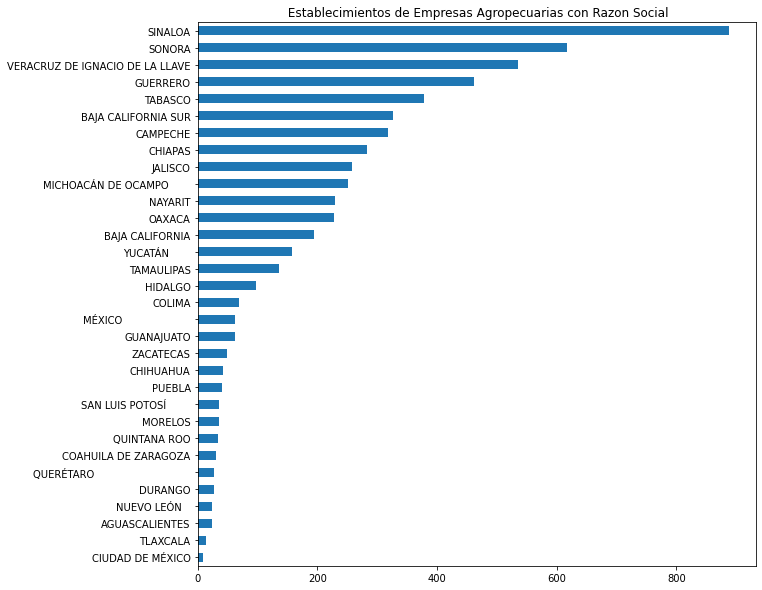

In [49]:
df_rs['entidad'].value_counts().sort_values().plot(kind='barh', 
                                  title=' Establecimientos de Empresas Agropecuarias con Razon Social', figsize=(10,10))

**Personas ocupadas por empresas con razon social**

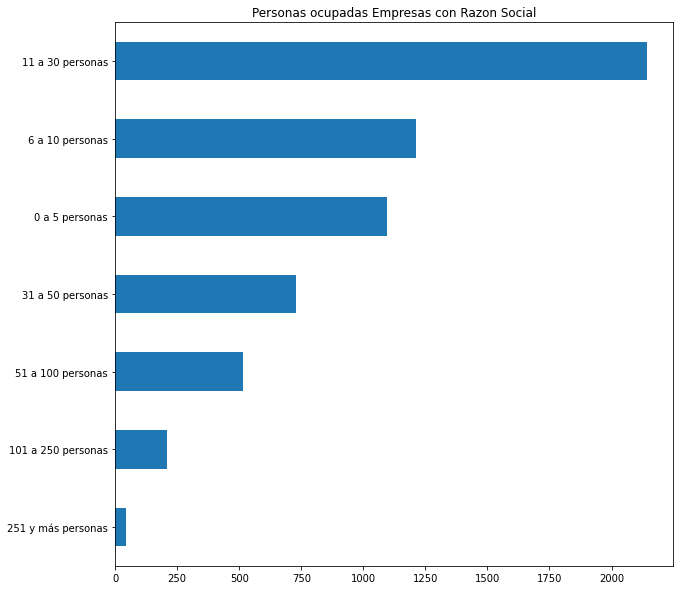

In [50]:
df_rs['per_ocu'].value_counts().sort_values().plot(kind='barh',
                                     title='Personas ocupadas Empresas con Razon Social',figsize=(10,10))

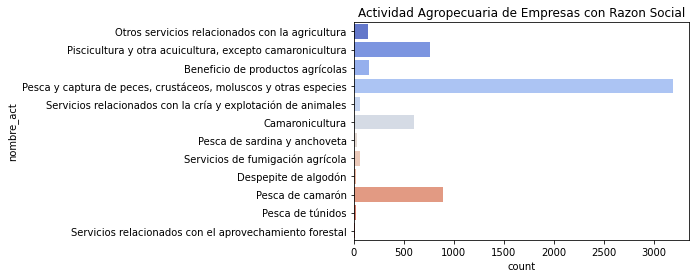

In [51]:
sns.countplot(y='nombre_act', palette='coolwarm', data=df_rs).set_title('Actividad Agropecuaria de Empresas con Razon Social')
plt.show()

## Mapeando con KeplerGl ##

Con la libreria KeplerGl construimos un mapa de puntos para mostrar la ubicación de las unidades económicas. 


*   Definimos en la escala de colores la variable **per_ocu** que corresponde a las personas empleadas por unidad económica

*   En la parte de filtros  colocamos las variables **per_ocu** y **nombre_act** 





In [52]:
# Instalamos una herramienta de jupyter en colab para poder visualizar el mapa
from google.colab import output
output.enable_custom_widget_manager()

In [53]:
#@title Unidades Económicas que se dedican a la Agricultura, cría y explotación de animales, aprovechamiento forestal, pesca y caza 
kepler_map = keplergl.KeplerGl(height=500)
kepler_map

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(height=500)

In [54]:
kepler_map.add_data(data=df2, name="Unidades Economicas")

In [55]:
kepler_map.config

{}